In [1]:
import joblib
import pandas as pd
import json
import numpy as np
import umap
import matplotlib.pyplot as plt

c:\Users\youbowei0126\.conda\envs\conda_venv_2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
data_with_pred_path = 'data_with_pred.joblib'
data_with_pred = joblib.load(data_with_pred_path)
index_info = json.load(open('index_info.json', 'r'))
# load the data with predictions
model_list = np.array(["CAT","CNN","GBM","LR","MLP","RF","SVR","TRANS","XBG","Diffusion"])
data_with_pred["ECNumber"]

0          4.2.3.4
1          4.2.3.4
2          4.2.3.4
3        2.1.1.255
4        2.1.1.255
           ...    
17005     1.1.1.82
17006     1.1.1.82
17007     1.1.1.82
17008     1.1.1.82
17009     1.1.1.82
Name: ECNumber, Length: 17010, dtype: object

In [11]:
data_with_pred["protein_id"]=[int(i.split(".")[0]) for i in data_with_pred["ECNumber"]]
data_with_pred["protein_id"]
PROTEIN_TYPES_NAMES=np.array([None,"Oxidoreductases","Transferases","Hydrolases","Lyases","Isomerases","Ligases","Translocases"])

data_with_pred["protein_label"]=data_with_pred["protein_id"].astype(str)+"_"+PROTEIN_TYPES_NAMES[data_with_pred["protein_id"]]
data_with_pred[["protein_id","protein_label"]]

,protein_id,protein_label
0,4,4_Lyases
1,4,4_Lyases
2,4,4_Lyases
3,2,2_Transferases
4,2,2_Transferases
...,...,...
17005,1,1_Oxidoreductases
17006,1,1_Oxidoreductases
17007,1,1_Oxidoreductases
17008,1,1_Oxidoreductases


In [12]:
test_with_pred= data_with_pred.copy().loc[index_info['test_index'],:]
train_with_pred= data_with_pred.copy().loc[index_info['train_index'],:]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XBG_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XBG_error,Diffusion_error,UMAP_feature_protein,protein_id,protein_label
4176,1.4.1.1,Bacillus subtilis,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADH,MIIGVPKEIKNNENRVALTPGGVSQLISNGHRVLVETGAGLGSGFE...,36.07,s^(-1),1.557146,"[0.37773794, -0.23257656, -0.8160372, -0.24778...","[-0.03495988, -0.09377112, 0.110738434, 0.0476...",-1.557146,-1.784959,-2.196850,-1.316057,-2.314071,-2.135072,-2.111660,-1.481858,-2.694233,-1.754269,-1.660531,-0.227813,-0.639704,0.241089,-0.756925,-0.577926,-0.554514,0.075288,-1.137087,-0.197123,-0.103385,"[3.7454278469085693, 8.478062629699707]",1,1_Oxidoreductases
3120,3.4.11.10,Vibrio proteolyticus,CC(C)CC(C(=O)NC(C(C)C)C(=O)O)N,Leu-Val,MKYTKTLLAMVLSATFCQAYAEDKVWISIGADANQTVMKSGAESIL...,15.00,s^(-1),1.176091,"[0.6116207, -0.14222568, 0.08461928, -0.360963...","[-0.035975862, 0.112611905, 0.21559553, 0.0940...",-1.176091,-1.278968,-1.011807,-1.261036,-2.203353,-1.086405,-1.244628,-1.564233,-0.928831,-1.568913,-0.998888,-0.102876,0.164284,-0.084945,-1.027262,0.089686,-0.068537,-0.388141,0.247261,-0.392821,0.177203,"[0.7640505433082581, -1.603044033050537]",3,3_Hydrolases
13113,1.1.1.39,Homo sapiens,[Mg+2],Mg2+,MLSRLRVVSTTCTLACRHLHIKEKGKPLMLNPRTNKGMAFTLQERQ...,111.09,s^(-1),2.045675,"[0.99093604, 0.650355, -0.12241046, -0.6324832...","[0.02841968, -0.10092532, 0.015064403, 0.17305...",-2.045675,-1.615220,-1.624045,-1.002642,-0.371770,-2.265819,-1.672024,-1.043870,-2.113835,-1.496400,-1.489795,0.430455,0.421630,1.043033,1.673905,-0.220144,0.373651,1.001805,-0.068160,0.549275,0.555880,"[2.357663154602051, 4.673681735992432]",1,1_Oxidoreductases
2141,1.1.1.169,Thermococcus kodakarensis,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADH,MRIYVLGAGSIGSLFGALLARAGNDVTLIGRREQVDAINKNGLHVF...,19.70,s^(-1),1.294466,"[0.37773794, -0.23257656, -0.8160372, -0.24778...","[-0.01912616, -0.14530116, 0.08931538, 0.06997...",-1.294466,-0.888047,-0.728215,-0.712400,-1.292159,-1.517282,-0.839721,-1.155310,-0.889891,-0.296737,-1.174681,0.406419,0.566251,0.582067,0.002307,-0.222816,0.454745,0.139156,0.404575,0.997729,0.119785,"[3.480088949203491, 9.614116668701172]",1,1_Oxidoreductases
12646,5.3.1.5,Lactococcus lactis subsp. lactis,C(C(C(C(=O)CO)O)O)O,D-Xylulose,MAYFNDIAPIKYEGTKTKNMFAFRHYNPEEVVAGKTMEEQLHFALA...,7.20,s^(-1),0.857332,"[0.3987355, -0.3406953, -0.006433134, -0.19154...","[0.110262096, -0.030934181, 0.04924192, 0.0780...",-0.857332,-0.650934,-0.862690,-0.776633,-1.025252,-1.736271,-0.908310,-0.906837,-2.128962,-0.046304,-0.651858,0.206398,-0.005357,0.080700,-0.167920,-0.878938,-0.050978,-0.049504,-1.271630,0.811028,0.205475,"[1.289934515953064, -0.06634417176246643]",5,5_Isomerases
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4871,1.1.1.50,Rattus norvegicus,CC12CCC(=O)CC1CCC3C2CCC4(C3CCC4=O)C,"5alpha-Androstane-3,17-dione",MDSISLRVALNDGNFIPVLGFGTTVPEKVAKDEVIKATKIAIDNGF...,0.42,s^(-1),-0.376751,"[0.6490457, -0.288862, -0.23150042, -0.4583561...","[0.008132604, -0.17398113, 0.21847555, 0.10369...",0.376751,0.445345,0.392323,1.059772,0.651513,0.375263,0.353588,0.844406,0.760956,0.308518,0.399014,0.068594,0.015572,0.683022,0.274762,-0.001488,-0.023163,0.467655,0.384205,-0.068232,0.022263,"[12.757204055786133, 24.088529586791992]",1,1_Oxidoreductases
14349,2.3.1.157,Escherichia coli,C(C1C(C(C(C(O1)OP(=O)(O)O)N)O)O)O,D-Glucosamine 1-phosphate,MLNNAMSVVILAAAKGTRMYSDLPKVLHTLAGKAMVQHVIDAANEL...,811.00,s^(-1),2.909021,"[0.7779539, -0.50376207, -0.37081337, 0.516194...","[-0.059814937, -0.024832325, -0.12270706, 0.11...",-2.909021,-1.803721,-1.827297,-1.348442,-1.390258,-2.150742,-1.835187,-1.261202,-1.990547,-2.345519,-2.174944,1.105300,1.08172

In [6]:
outlier_df=joblib.load("./outlier_data/outlier_df.joblib")
outlier_indices_dict=joblib.load("./outlier_data/outlier_indices_dict.joblib")
data_with_pred=joblib.load("./data_with_pred.joblib")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
# test_with_pred
outlier_indices_dict["CAT"]["indices"]

[14857,
 12637,
 5250,
 10538,
 15671,
 411,
 10887,
 14716,
 5725,
 13936,
 16557,
 1768,
 8401,
 13937,
 2680,
 4560,
 5711,
 5836,
 16715,
 4518,
 7495,
 10713,
 9289,
 8410,
 15810,
 16498,
 1767,
 4981,
 14419,
 11162,
 9411,
 15674,
 2025,
 2286,
 16509,
 4038,
 8394,
 12442,
 16499,
 7809,
 4496,
 8776,
 13562,
 683,
 1085,
 10742,
 6879,
 2692,
 6224,
 14041,
 8565,
 3000,
 14664,
 14647,
 12263,
 11838,
 1580,
 11273,
 9273,
 20,
 9965,
 5026,
 2619,
 12717,
 15676,
 12888,
 4848,
 14497,
 12382,
 12867,
 5425,
 6517,
 11974,
 3193,
 14557,
 6632,
 10687,
 4115,
 7575,
 15010,
 5155,
 4111,
 10143,
 14433,
 10855,
 11893,
 9671,
 8144,
 8402,
 16087,
 15488,
 5384,
 1039,
 2596,
 7841,
 1579,
 16625,
 4980,
 2927,
 4189,
 15377,
 573,
 16184,
 4254,
 2414,
 3107,
 11571,
 3522,
 2086,
 7932,
 9390,
 1632,
 16554,
 5893,
 1332,
 5385,
 4525,
 4256,
 15195,
 11018,
 16497,
 5678,
 15680,
 15252,
 13929,
 624,
 606,
 3952]

In [18]:
for col in model_list:
    test_with_pred[col + "_is_outlier"] = [
        (1 if i in outlier_indices_dict[col]["indices"] else 0)
        for i in test_with_pred.index
    ]
test_with_pred["outlier_count"] = test_with_pred[model_list + "_is_outlier"].sum(axis=1)
test_with_pred.sort_values(by="CAT_error", ascending=False, inplace=False)

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XBG_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XBG_error,Diffusion_error,UMAP_feature_protein,protein_id,protein_label,TSNE_feature,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XBG_is_outlier,Diffusion_is_outlier,outlier_count
10538,5.4.3.6,Chondromyces crocatus,C1=CC(=CC=C1CC(C(=O)O)N)O,L-Tyrosine,MKITGSNLSIYDVADVCMKRATVELDPSQLERVAVAHERTQAWGEA...,7000.000000,s^(-1),3.845098,"[-0.1019823, -0.0722533, -0.36469975, -0.12317...","[0.0144641185, -0.027494874, 0.040822122, 0.06...",-3.845098,1.543786,3.051943,-0.230865,0.343690,3.270069,2.290861,-0.529445,3.782483,1.824189,2.797733,5.388884,6.897041,3.614233,4.188788,7.115167,6.135959,3.315653,7.627581,5.669287,6.642831,"[2.7001898288726807, 3.1150124073028564]",5,5_Isomerases,"[30.545747756958008, 90.54298400878906]",1,1,1,1,1,1,1,1,1,1,10
16557,1.1.1.42,Homo sapiens,[Mg+2].[Cl-].[Cl-],MgCl2,MSKKISGGSVVEMQGDEMTRIIWELIKEKLIFPYVELDLHSYDLGI...,440000.000000,s^(-1),5.643453,"[0.61654186, 0.67866236, -0.53024876, -0.37753...","[0.05490979, 0.022688624, 0.117036186, 0.20995...",-5.643453,-1.477158,-1.249064,-1.130229,-1.318906,-1.388277,-2.598953,-1.674327,-1.549926,-2.376296,-1.536571,4.166295,4.394389,4.513224,4.324547,4.255175,3.044499,3.969126,4.093526,3.267156,4.106882,"[1.3460991382598877, 2.2371366024017334]",1,1_Oxidoreductases,"[28.349193572998047, 101.73194122314453]",1,1,1,1,1,1,1,1,1,1,10
2680,5.4.99.5,Escherichia coli,C=C(C(=O)O)OC1C=C(C=CC1O)C(=O)O,Chorismate,MTSENPLLALREKISALDEKLLALLAERRELAVEVGKAKLLSHRPV...,366000.000000,s^(-1),5.563481,"[0.066073135, -0.08069895, -0.03411204, -0.048...","[-0.14273229, -0.10213962, 0.089699835, -0.035...",-5.563481,-1.541581,-1.514149,-0.698495,-0.403426,-1.525756,-1.678870,-0.701776,-1.525772,-1.536909,-1.412261,4.021901,4.049332,4.864986,5.160055,4.037725,3.884611,4.861705,4.037709,4.026572,4.151220,"[5.7036895751953125, 0.6193918585777283]",5,5_Isomerases,"[-0.6247822642326355, 36.14666748046875]",1,1,1,1,1,1,1,1,1,1,10
5711,3.2.1.45,Paenibacillus sp.,C1=CC(=C(C=C1[N+](=O)[O-])[N+](=O)[O-])OC2C(C(...,"2,4-Dinitrophenyl-alpha-D-glucopyranoside",MAQLTLEEKAGLCSGESFWRTKAIDRLGIPSIMMTDGPHGLRKQAG...,470.000000,s^(-1),2.672098,"[0.26610664, 0.18639347, -0.19988379, 0.341697...","[-0.08164786, -0.12959291, 0.15148923, 0.10655...",-2.672098,0.960307,1.254229,-0.496354,0.922822,1.674789,1.464746,-0.866294,1.694321,1.320752,1.370596,3.632405,3.926327,2.175744,3.594920,4.346887,4.136844,1.805803,4.366418,3.992850,4.042694,"[1.1997848749160767, -2.0934412479400635]",3,3_Hydrolases,"[-87.01923370361328, 4.017230033874512]",1,1,0,1,1,1,0,1,1,1,8
9289,2.4.1.133,Homo sapiens,C1=CN(C(=O)NC1=O)C2C(C(C(O2)COP(=O)(O)OP(=O)(O...,UDP-D-galactose,MFPSRRKAAQLPWEDGRSGLLSGGLPRKCSVFHLFVACLSLGFFSL...,5086.000000,s^(-1),3.706376,"[0.20797633, -0.65783435, -0.9539016, 0.431711...","[-0.043101504, -0.21683657, 0.059030365, 0.159...",-3.706376,-0.284069,-0.083028,-0.171402,-0.042815,0.189798,-0.178568,-0.058432,0.067806,-0.650118,0.026533,3.422307,3.623348,3.534975,3.663561,3.896174,3.527808,3.647944,3.774183,3.056258,3.732910,"[4.815471649169922, -5.331865310668945]",2,2_Transferases,"[-78.26795959472656, -63.271846771240234]",1,1,1,1,1,1,1,1,1,1,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411,2.3.2.13,Streptomyces mobaraensis,CCN,Ethylamine,MRIRRRALVFATMSAVLCTAGFMPSAGEAAADNGAGEETKSYAETY...,0.000550,s^(-1),-3.259637,"[1.0804824, 2.1483438, -0.7858922, -2.305726, ...","[0.043877244, -0.04351817, 0.16157916, 0.22183...",3.259637,-1.371216,-3.444591,-1.235720,-2.702758,-2.632753,-1.320626,-1.446607,-1.967864,-1.991063,-2.

# overlaping


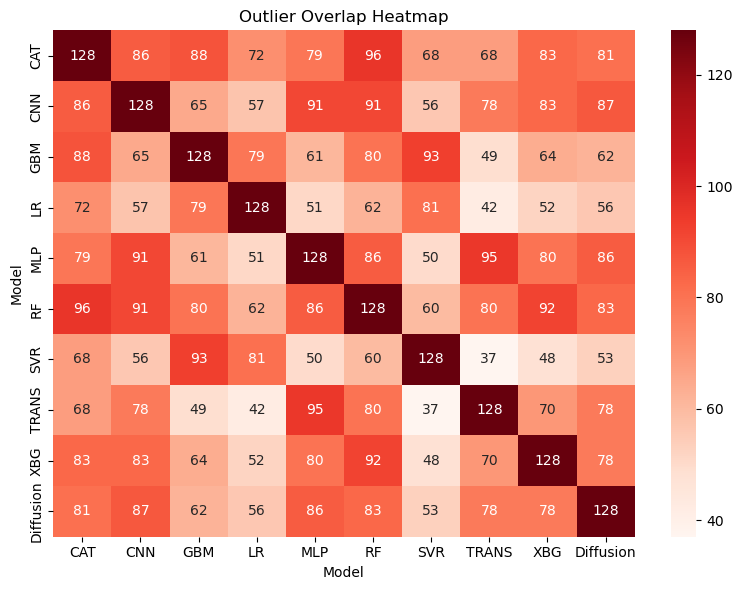

In [8]:
# Calculate the overlap matrix for outlier indices between models
outlier_indices = {col: set(outlier_df[col].index) for col in model_list}
import numpy as np

# Initialize the overlap matrix
overlap_matrix = np.zeros((len(model_list), len(model_list)), dtype=int)
for i, model_i in enumerate(model_list):
    for j, model_j in enumerate(model_list):
        # Count the number of overlapping outlier indices between two models
        overlap_matrix[i, j] = len(outlier_indices[model_i] & outlier_indices[model_j])

import seaborn as sns
import matplotlib.pyplot as plt

# Plot the overlap matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(overlap_matrix, annot=True, fmt="d", cmap="Reds", xticklabels=model_list, yticklabels=model_list)
plt.title("Outlier Overlap Heatmap")
plt.xlabel("Model")
plt.ylabel("Model")
plt.tight_layout()
plt.show()

## outlier count

In [8]:
# Sort value_counts by the outlier_count value (index), not by count
print(test_with_pred["outlier_count"].value_counts().sort_index(ascending=False))

outlier_count
10      28
9        9
8       16
7       17
6       23
5       19
4       28
3       31
2       52
1      130
0     2199
Name: count, dtype: int64


# pca and umap for substrate

In [9]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
pca.fit(np.vstack(data_with_pred["metabolite_features"].values))
X_pca = pca.fit_transform(np.vstack(test_with_pred["metabolite_features"].values))
test_with_pred["PCA_feature"] = [x.tolist() for x in X_pca]
data_with_pred["PCA_feature"] = [x.tolist() for x in pca.transform(np.vstack(data_with_pred["metabolite_features"].values))]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XBG_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XBG_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XBG_is_outlier,Diffusion_is_outlier,outlier_count,PCA_feature
4176,1.4.1.1,Bacillus subtilis,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADH,MIIGVPKEIKNNENRVALTPGGVSQLISNGHRVLVETGAGLGSGFE...,36.07,s^(-1),1.557146,"[0.37773794, -0.23257656, -0.8160372, -0.24778...","[-0.03495988, -0.09377112, 0.110738434, 0.0476...",-1.557146,-1.784959,-2.196850,-1.316057,-2.314071,-2.135072,-2.111660,-1.481858,-2.694233,-1.754269,-1.660531,-0.227813,-0.639704,0.241089,-0.756925,-0.577926,-0.554514,0.075288,-1.137087,-0.197123,-0.103385,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-7.0485148429870605, 0.8372637033462524, -0.6..."
3120,3.4.11.10,Vibrio proteolyticus,CC(C)CC(C(=O)NC(C(C)C)C(=O)O)N,Leu-Val,MKYTKTLLAMVLSATFCQAYAEDKVWISIGADANQTVMKSGAESIL...,15.00,s^(-1),1.176091,"[0.6116207, -0.14222568, 0.08461928, -0.360963...","[-0.035975862, 0.112611905, 0.21559553, 0.0940...",-1.176091,-1.278968,-1.011807,-1.261036,-2.203353,-1.086405,-1.244628,-1.564233,-0.928831,-1.568913,-0.998888,-0.102876,0.164284,-0.084945,-1.027262,0.089686,-0.068537,-0.388141,0.247261,-0.392821,0.177203,3,3_Hydrolases,0,0,0,0,0,0,0,0,0,0,0,"[1.0810012817382812, -2.0437209606170654, -4.7..."
13113,1.1.1.39,Homo sapiens,[Mg+2],Mg2+,MLSRLRVVSTTCTLACRHLHIKEKGKPLMLNPRTNKGMAFTLQERQ...,111.09,s^(-1),2.045675,"[0.99093604, 0.650355, -0.12241046, -0.6324832...","[0.02841968, -0.10092532, 0.015064403, 0.17305...",-2.045675,-1.615220,-1.624045,-1.002642,-0.371770,-2.265819,-1.672024,-1.043870,-2.113835,-1.496400,-1.489795,0.430455,0.421630,1.043033,1.673905,-0.220144,0.373651,1.001805,-0.068160,0.549275,0.555880,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[7.39311408996582, 5.774495601654053, -5.53712..."
2141,1.1.1.169,Thermococcus kodakarensis,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADH,MRIYVLGAGSIGSLFGALLARAGNDVTLIGRREQVDAINKNGLHVF...,19.70,s^(-1),1.294466,"[0.37773794, -0.23257656, -0.8160372, -0.24778...","[-0.01912616, -0.14530116, 0.08931538, 0.06997...",-1.294466,-0.888047,-0.728215,-0.712400,-1.292159,-1.517282,-0.839721,-1.155310,-0.889891,-0.296737,-1.174681,0.406419,0.566251,0.582067,0.002307,-0.222816,0.454745,0.139156,0.404575,0.997729,0.119785,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-7.048534393310547, 0.8372666835784912, -0.69..."
12646,5.3.1.5,Lactococcus lactis subsp. lactis,C(C(C(C(=O)CO)O)O)O,D-Xylulose,MAYFNDIAPIKYEGTKTKNMFAFRHYNPEEVVAGKTMEEQLHFALA...,7.20,s^(-1),0.857332,"[0.3987355, -0.3406953, -0.006433134, -0.19154...","[0.110262096, -0.030934181, 0.04924192, 0.0780...",-0.857332,-0.650934,-0.862690,-0.776633,-1.025252,-1.736271,-0.908310,-0.906837,-2.128962,-0.046304,-0.651858,0.206398,-0.005357,0.080700,-0.167920,-0.878938,-0.050978,-0.049504,-1.271630,0.811028,0.205475,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[2.9520697593688965, -1.7535117864608765, -3.8..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4871,1.1.1.50,Rattus norvegicus,CC12CCC(=O)CC1CCC3C2CCC4(C3CCC4=O)C,"5alpha-Androstane-3,17-dione",MDSISLRVALNDGNFIPVLGFGTTVPEKVAKDEVIKATKIAIDNGF...,0.42,s^(-1),-0.376751,"[0.6490457, -0.288862, -0.23150042, -0.4583561...","[0.008132604, -0.17398113, 0.21847555, 0.10369...",0.376751,0.445345,0.392323,1.059772,0.651513,0.375263,0.353588,0.844406,0.760956,0.308518,0.399014,0.068594,0.015572,0.683022,0.274762,-0.001488,-0.023163,0.467655,0.384205,-0.068232,0.022263,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-1.9093085527420044, 4.064277648925781, -1.50..."
1

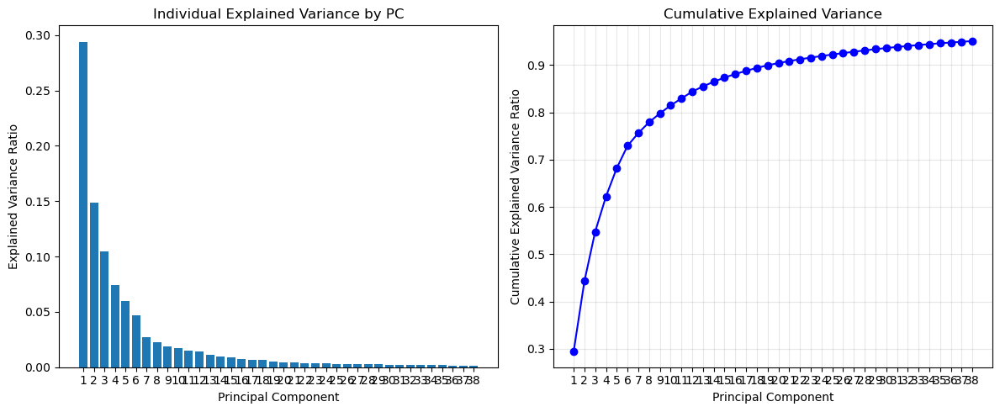

In [10]:
# 繪製 variance 解釋比例圖
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 5))

# Individual variance plot
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Individual Explained Variance by PC')
plt.xticks(range(1, len(explained_variance_ratio) + 1))

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


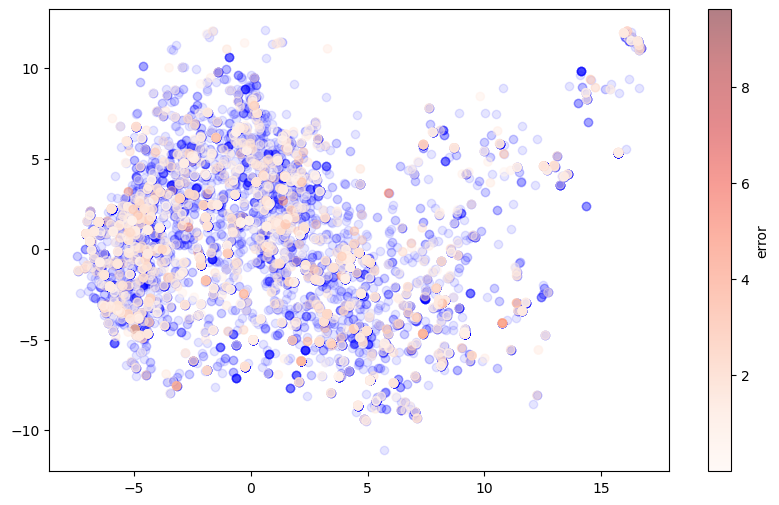

In [11]:
plt.figure(figsize=(10, 6))
pc1_values = [pca_feat[0] for pca_feat in test_with_pred["PCA_feature"]]
pc2_values = [pca_feat[1] for pca_feat in test_with_pred["PCA_feature"]]

plt.scatter(
    [pca_feat[0] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature"]],
    [pca_feat[1] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature"]],
    color="b",
    alpha=0.1,
)
plt.scatter(
    pc1_values,
    pc2_values,
    c=np.abs(test_with_pred["CAT_error"]),
    cmap="Reds",
    alpha=0.5,
)

# plt.scatter(


plt.colorbar(label='error')
plt.show()

In [ ]:
from umap import UMAP
import matplotlib.pyplot as plt

# delete the duplicate rows
X_all = np.vstack(data_with_pred["metabolite_features"].values)
X_test = np.vstack(test_with_pred["metabolite_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"origional data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use the unique rows to train UMAP
umap_reducer = UMAP(
    n_components=2, 
    random_state=42,
    n_neighbors=15,
    min_dist=0.1
)
umap_reducer.fit(unique_rows)

# transform the test data
X_umap = umap_reducer.transform(X_test)

# save UMAP results to DataFrame
test_with_pred["UMAP_feature"] = [x.tolist() for x in X_umap]
data_with_pred["UMAP_feature"] = [x.tolist() for x in umap_reducer.transform(X_all)]



原始數據: 17010 個點
去重後數據: 2706 個點


c:\Users\youbowei0126\.conda\envs\conda_venv_2\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


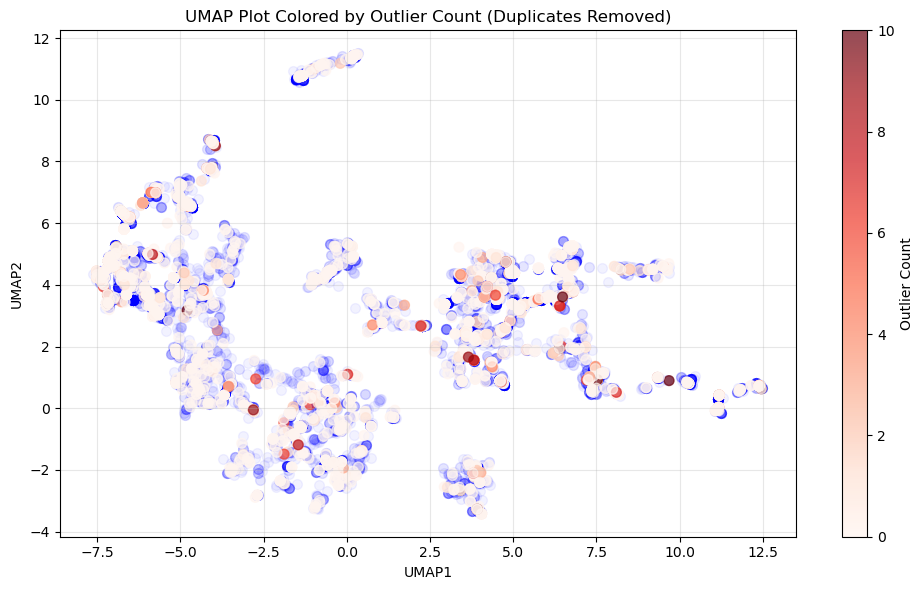

In [34]:


# plot UMAP
plt.figure(figsize=(10, 6))
umap1_values = [umap_feat[0] for umap_feat in test_with_pred["UMAP_feature"]]
umap2_values = [umap_feat[1] for umap_feat in test_with_pred["UMAP_feature"]]
umap1_values_train = [umap_feat[0] for umap_feat in data_with_pred.loc[index_info['train_index'],"UMAP_feature"]]
umap2_values_train = [umap_feat[1] for umap_feat in data_with_pred.loc[index_info['train_index'],"UMAP_feature"]]

plt.scatter(
    umap1_values_train,
    umap2_values_train,
    color="b",
    alpha=0.05,
    s=50
)
plt.scatter(
    umap1_values,
    umap2_values,
    c=test_with_pred["outlier_count"],
    cmap="Reds",
    alpha=0.7,
    s=50
)
plt.colorbar(label='Outlier Count')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Plot Colored by Outlier Count (Duplicates Removed)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/umap_plot.png",dpi=600)
plt.savefig("./outlier_data/umap_plot.svg")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get UMAP features for training set
umap_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "UMAP_feature"]])

# Create grid (with padding)
x_padding = (umap_train[:, 0].max() - umap_train[:, 0].min()) * 0.1
y_padding = (umap_train[:, 1].max() - umap_train[:, 1].min()) * 0.1

x_min, x_max = umap_train[:, 0].min() - x_padding, umap_train[:, 0].max() + x_padding
y_min, y_max = umap_train[:, 1].min() - y_padding, umap_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(umap_train.T)
density = kde(grid_points).reshape(xx.shape)

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])
    
    # Group by UMAP coordinates and keep only the maximum error for each unique molecule
    test_filtered['umap_coord'] = test_filtered['UMAP_feature'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('umap_coord')['abs_error'].idxmax()]
    
    # Extract coordinates for plotting
    umap1_values_unique = [umap_feat[0] for umap_feat in test_unique["UMAP_feature"]]
    umap2_values_unique = [umap_feat[1] for umap_feat in test_unique["UMAP_feature"]]
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap (修改：使藍色更深)
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9)
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot (unique molecules only)
    scatter = ax.scatter(
        umap1_values_unique,
        umap2_values_unique,
        c=test_unique['abs_error'],
        cmap="Reds",
        alpha=1,
        s=50
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02)
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'Train Distribution Density with Test {col} Error (Unique Molecules)')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/umap_density_mol_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/umap_density_mol_plot_{col}.svg")
    plt.show()

KeyError: 'UMAP_feature'

# pca and umap for substrate

In [9]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
pca.fit(np.vstack(data_with_pred["protein_features"].values))
X_pca = pca.fit_transform(np.vstack(test_with_pred["protein_features"].values))
test_with_pred["PCA_feature_protein"] = [x.tolist() for x in X_pca]
data_with_pred["PCA_feature_protein"] = [x.tolist() for x in pca.transform(np.vstack(data_with_pred["protein_features"].values))]
test_with_pred

,ECNumber,Organism,Smiles,Substrate,Sequence,Raw Kd,Unit,Log Kd,metabolite_features,protein_features,label,CAT_pred,CNN_pred,GBM_pred,LR_pred,MLP_pred,RF_pred,SVR_pred,TRANS_pred,XBG_pred,Diffusion_pred,CAT_error,CNN_error,GBM_error,LR_error,MLP_error,RF_error,SVR_error,TRANS_error,XBG_error,Diffusion_error,protein_id,protein_label,CAT_is_outlier,CNN_is_outlier,GBM_is_outlier,LR_is_outlier,MLP_is_outlier,RF_is_outlier,SVR_is_outlier,TRANS_is_outlier,XBG_is_outlier,Diffusion_is_outlier,outlier_count,PCA_feature_protein
4176,1.4.1.1,Bacillus subtilis,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADH,MIIGVPKEIKNNENRVALTPGGVSQLISNGHRVLVETGAGLGSGFE...,36.07,s^(-1),1.557146,"[0.37773794, -0.23257656, -0.8160372, -0.24778...","[-0.03495988, -0.09377112, 0.110738434, 0.0476...",-1.557146,-1.784959,-2.196850,-1.316057,-2.314071,-2.135072,-2.111660,-1.481858,-2.694233,-1.754269,-1.660531,-0.227813,-0.639704,0.241089,-0.756925,-0.577926,-0.554514,0.075288,-1.137087,-0.197123,-0.103385,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-0.2886636257171631, -0.2625661790370941, 0.7..."
3120,3.4.11.10,Vibrio proteolyticus,CC(C)CC(C(=O)NC(C(C)C)C(=O)O)N,Leu-Val,MKYTKTLLAMVLSATFCQAYAEDKVWISIGADANQTVMKSGAESIL...,15.00,s^(-1),1.176091,"[0.6116207, -0.14222568, 0.08461928, -0.360963...","[-0.035975862, 0.112611905, 0.21559553, 0.0940...",-1.176091,-1.278968,-1.011807,-1.261036,-2.203353,-1.086405,-1.244628,-1.564233,-0.928831,-1.568913,-0.998888,-0.102876,0.164284,-0.084945,-1.027262,0.089686,-0.068537,-0.388141,0.247261,-0.392821,0.177203,3,3_Hydrolases,0,0,0,0,0,0,0,0,0,0,0,"[0.23047147691249847, 0.3384847342967987, -0.4..."
13113,1.1.1.39,Homo sapiens,[Mg+2],Mg2+,MLSRLRVVSTTCTLACRHLHIKEKGKPLMLNPRTNKGMAFTLQERQ...,111.09,s^(-1),2.045675,"[0.99093604, 0.650355, -0.12241046, -0.6324832...","[0.02841968, -0.10092532, 0.015064403, 0.17305...",-2.045675,-1.615220,-1.624045,-1.002642,-0.371770,-2.265819,-1.672024,-1.043870,-2.113835,-1.496400,-1.489795,0.430455,0.421630,1.043033,1.673905,-0.220144,0.373651,1.001805,-0.068160,0.549275,0.555880,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[-1.1891025304794312, -0.3076004087924957, 0.2..."
2141,1.1.1.169,Thermococcus kodakarensis,C1C=CN(C=C1C(=O)N)C2C(C(C(O2)COP(=O)(O)OP(=O)(...,NADH,MRIYVLGAGSIGSLFGALLARAGNDVTLIGRREQVDAINKNGLHVF...,19.70,s^(-1),1.294466,"[0.37773794, -0.23257656, -0.8160372, -0.24778...","[-0.01912616, -0.14530116, 0.08931538, 0.06997...",-1.294466,-0.888047,-0.728215,-0.712400,-1.292159,-1.517282,-0.839721,-1.155310,-0.889891,-0.296737,-1.174681,0.406419,0.566251,0.582067,0.002307,-0.222816,0.454745,0.139156,0.404575,0.997729,0.119785,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[0.4608958661556244, -0.4103330969810486, 0.58..."
12646,5.3.1.5,Lactococcus lactis subsp. lactis,C(C(C(C(=O)CO)O)O)O,D-Xylulose,MAYFNDIAPIKYEGTKTKNMFAFRHYNPEEVVAGKTMEEQLHFALA...,7.20,s^(-1),0.857332,"[0.3987355, -0.3406953, -0.006433134, -0.19154...","[0.110262096, -0.030934181, 0.04924192, 0.0780...",-0.857332,-0.650934,-0.862690,-0.776633,-1.025252,-1.736271,-0.908310,-0.906837,-2.128962,-0.046304,-0.651858,0.206398,-0.005357,0.080700,-0.167920,-0.878938,-0.050978,-0.049504,-1.271630,0.811028,0.205475,5,5_Isomerases,0,0,0,0,0,0,0,0,0,0,0,"[-1.2539511919021606, -0.19615446031093597, -0..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4871,1.1.1.50,Rattus norvegicus,CC12CCC(=O)CC1CCC3C2CCC4(C3CCC4=O)C,"5alpha-Androstane-3,17-dione",MDSISLRVALNDGNFIPVLGFGTTVPEKVAKDEVIKATKIAIDNGF...,0.42,s^(-1),-0.376751,"[0.6490457, -0.288862, -0.23150042, -0.4583561...","[0.008132604, -0.17398113, 0.21847555, 0.10369...",0.376751,0.445345,0.392323,1.059772,0.651513,0.375263,0.353588,0.844406,0.760956,0.308518,0.399014,0.068594,0.015572,0.683022,0.274762,-0.001488,-0.023163,0.467655,0.384205,-0.068232,0.022263,1,1_Oxidoreductases,0,0,0,0,0,0,0,0,0,0,0,"[1.525742530822754, -0.830044686794281, -0.0

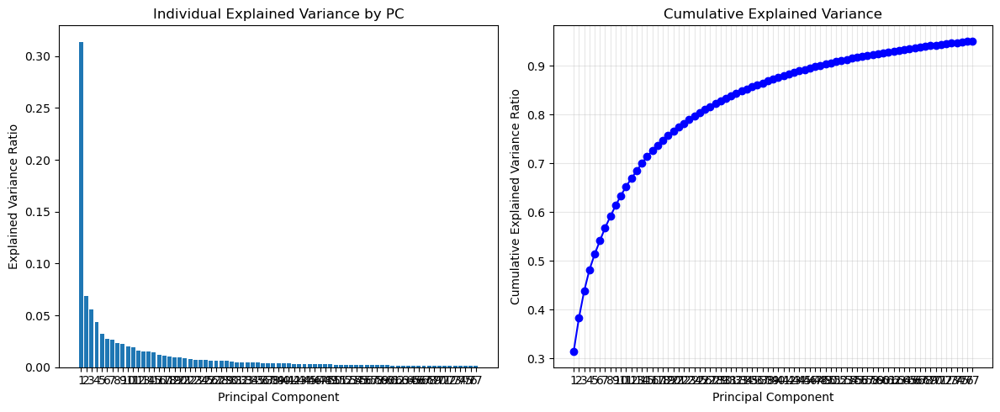

In [10]:
# 繪製 variance 解釋比例圖
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

plt.figure(figsize=(12, 5))

# Individual variance plot
plt.subplot(1, 2, 1)
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Individual Explained Variance by PC')
plt.xticks(range(1, len(explained_variance_ratio) + 1))

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
plt.xlabel('Principal Component')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance')
plt.xticks(range(1, len(cumulative_variance) + 1))
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

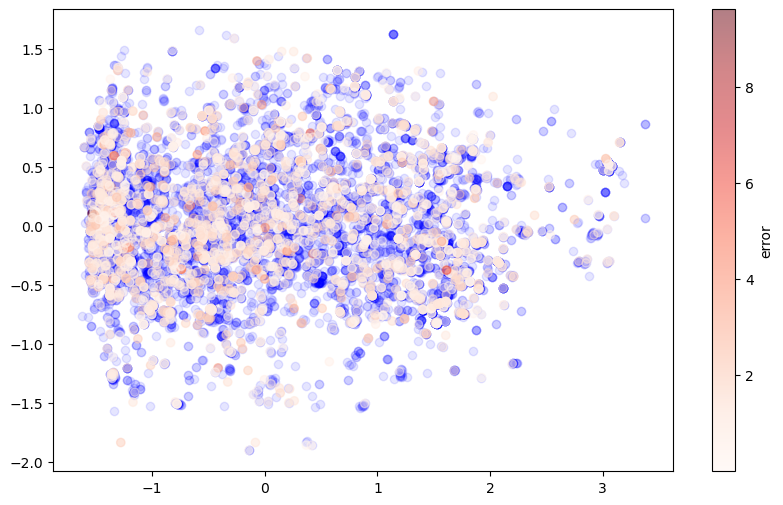

In [11]:
plt.figure(figsize=(10, 6))
pc1_values = [pca_feat[0] for pca_feat in test_with_pred["PCA_feature_protein"]]
pc2_values = [pca_feat[1] for pca_feat in test_with_pred["PCA_feature_protein"]]

plt.scatter(
    [pca_feat[0] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature_protein"]],
    [pca_feat[1] for pca_feat in data_with_pred.loc[index_info['train_index'],"PCA_feature_protein"]],
    color="b",
    alpha=0.1,
)
plt.scatter(
    pc1_values,
    pc2_values,
    c=np.abs(test_with_pred["CAT_error"]),
    cmap="Reds",
    alpha=0.5,
)

# plt.scatter(


plt.colorbar(label='error')
plt.show()

In [9]:
from umap import UMAP
import matplotlib.pyplot as plt

# delete the duplicate rows
X_all = np.vstack(data_with_pred["protein_features"].values)
X_test = np.vstack(test_with_pred["protein_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"origional data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use the unique rows to train UMAP
umap_reducer = UMAP(
    n_components=2, 
    random_state=42,
    n_neighbors=30,
    min_dist=0.5,
    metric='correlation'
)
umap_reducer.fit(unique_rows)

# transform the test data
X_umap = umap_reducer.transform(X_test)

# save UMAP results to DataFrame
test_with_pred["UMAP_feature_protein"] = [x.tolist() for x in X_umap]
data_with_pred["UMAP_feature_protein"] = [x.tolist() for x in umap_reducer.transform(X_all)]

origional data: 17010 points
reduced data: 7857 points


c:\Users\youbowei0126\.conda\envs\conda_venv_2\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


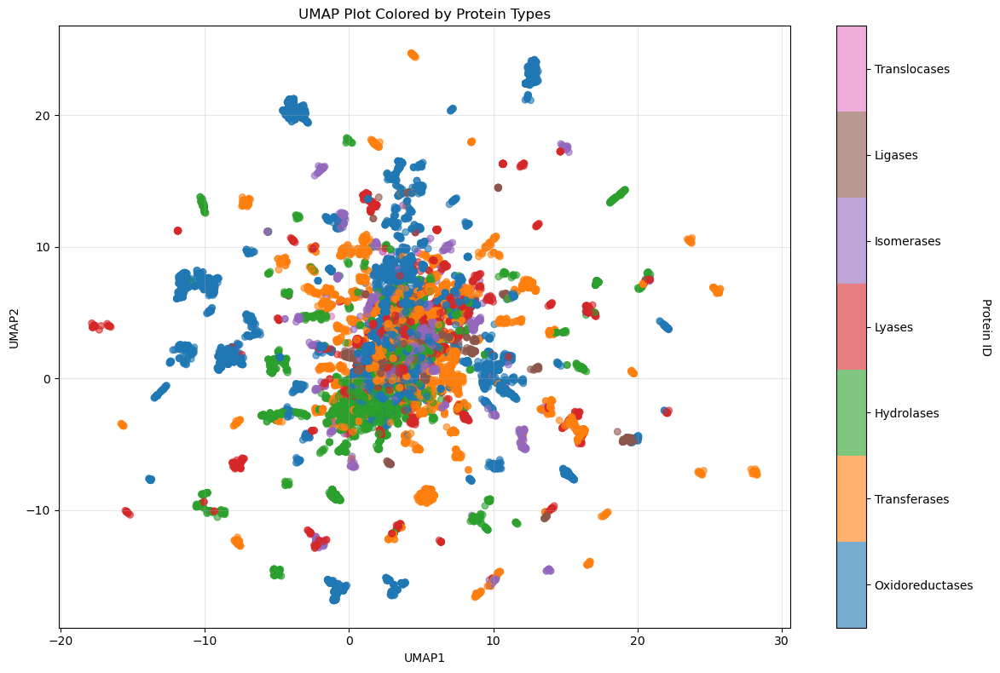

In [13]:
# Plot UMAP with different protein types colored
plt.figure(figsize=(12, 8))

# Get UMAP coordinates for all data
umap1_values_all = [umap_feat[0] for umap_feat in data_with_pred["UMAP_feature_protein"]]
umap2_values_all = [umap_feat[1] for umap_feat in data_with_pred["UMAP_feature_protein"]]

from matplotlib.colors import ListedColormap
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
cmap_7 = ListedColormap(colors)


# Use protein_id - 1 to map protein_id 1-7 to colormap indices 0-6
scatter = plt.scatter(
    umap1_values_all,
    umap2_values_all,
    c=data_with_pred['protein_id'] - 1,
    alpha=0.6,
    s=30,
    cmap=cmap_7,
    vmin=0,
    vmax=7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Protein ID', rotation=270, labelpad=15)

# Set ticks at the center of each color block
cbar.set_ticks([i + 0.5 for i in range(7)])
cbar.set_ticklabels([PROTEIN_TYPES_NAMES[i] for i in range(1, 8)])

plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title('UMAP Plot Colored by Protein Types')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/umap_protein_types.png", dpi=1200)
plt.savefig("./outlier_data/umap_protein_types.svg")
plt.show()

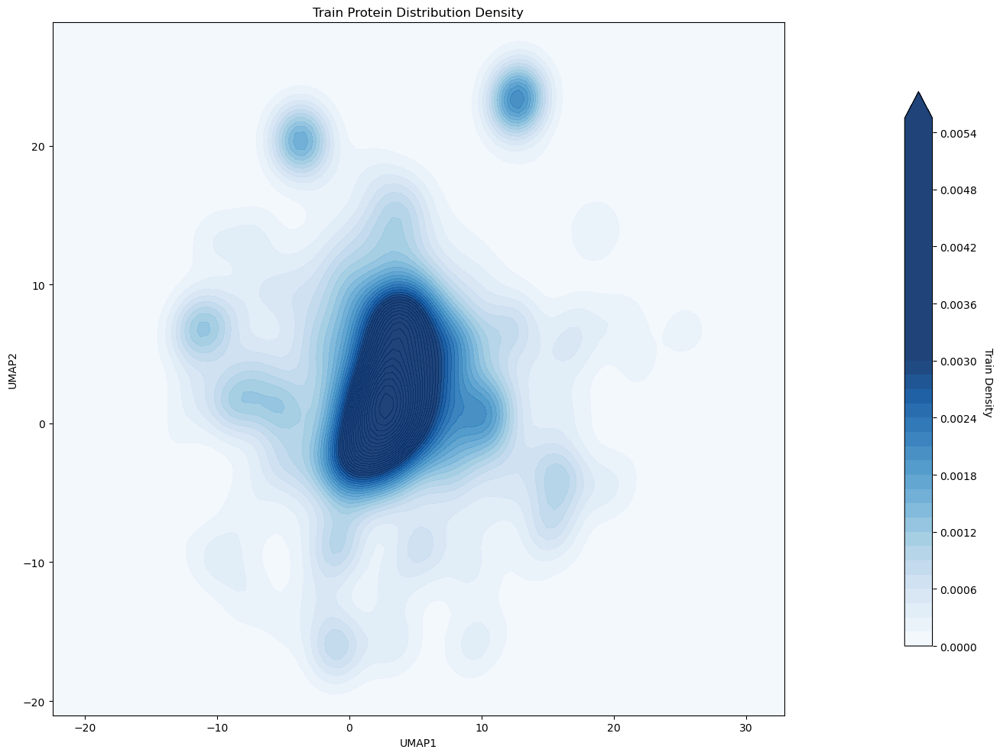

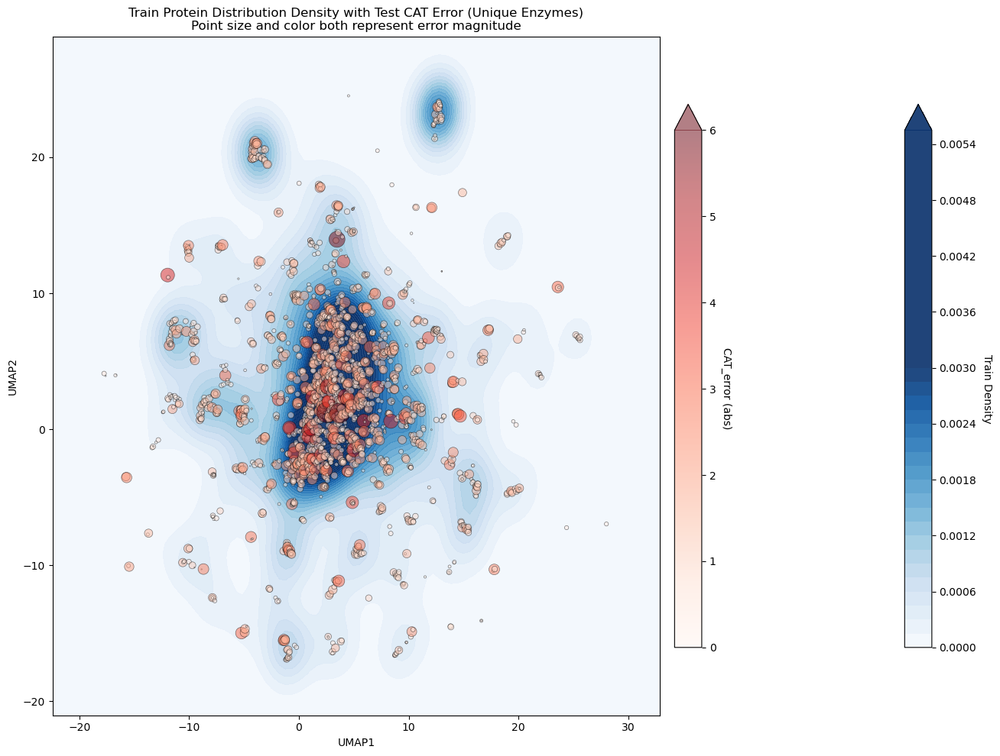

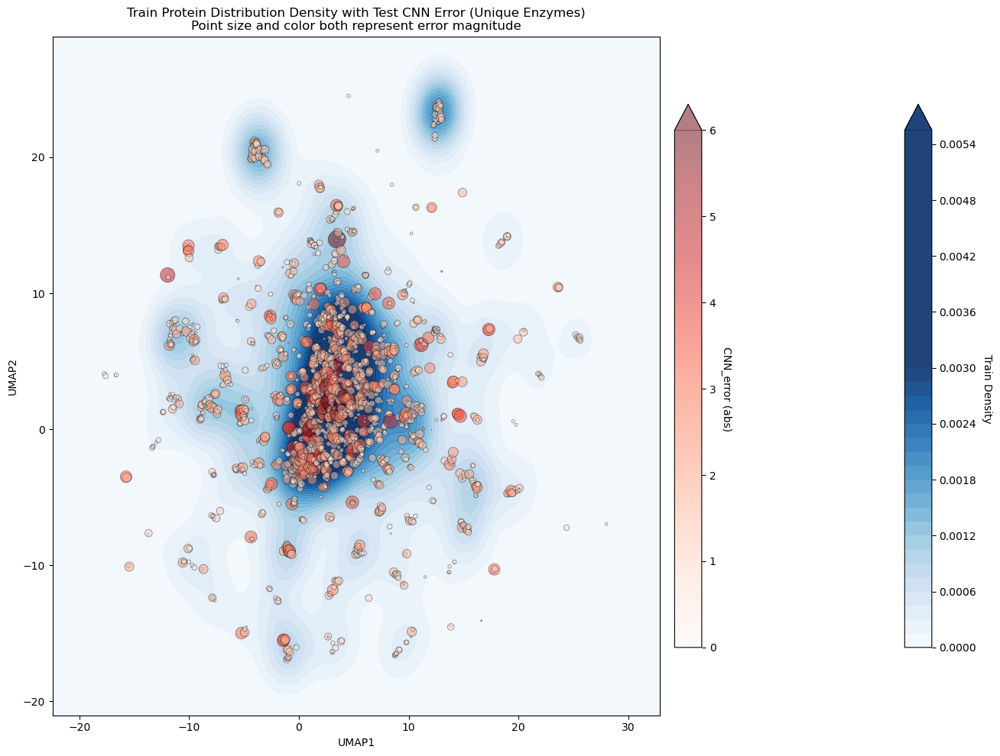

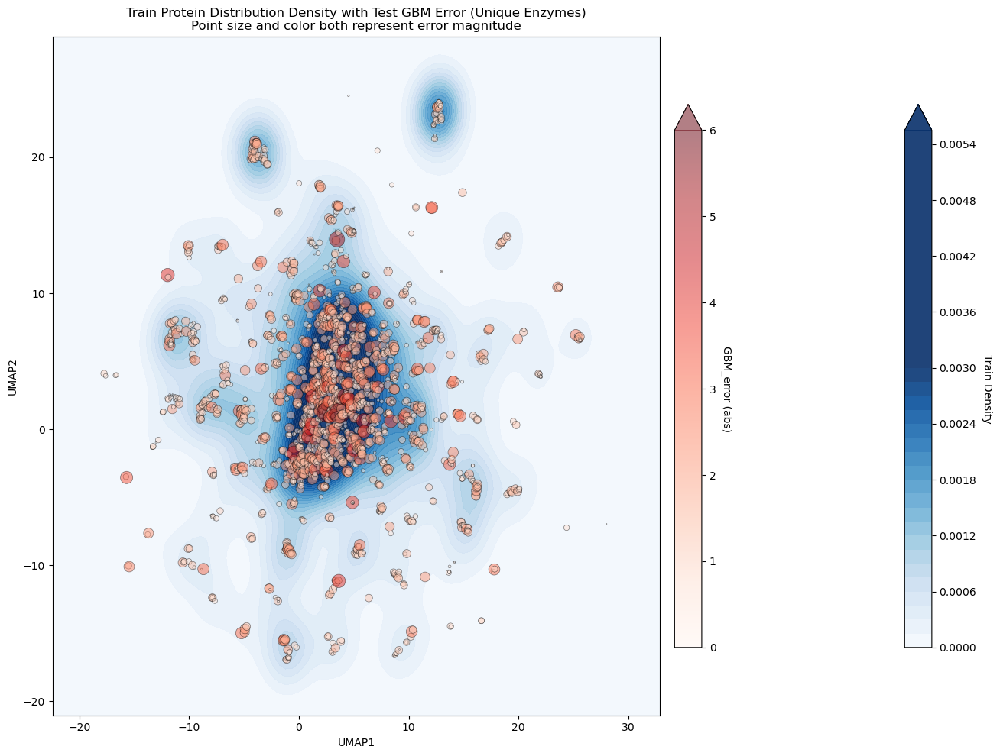

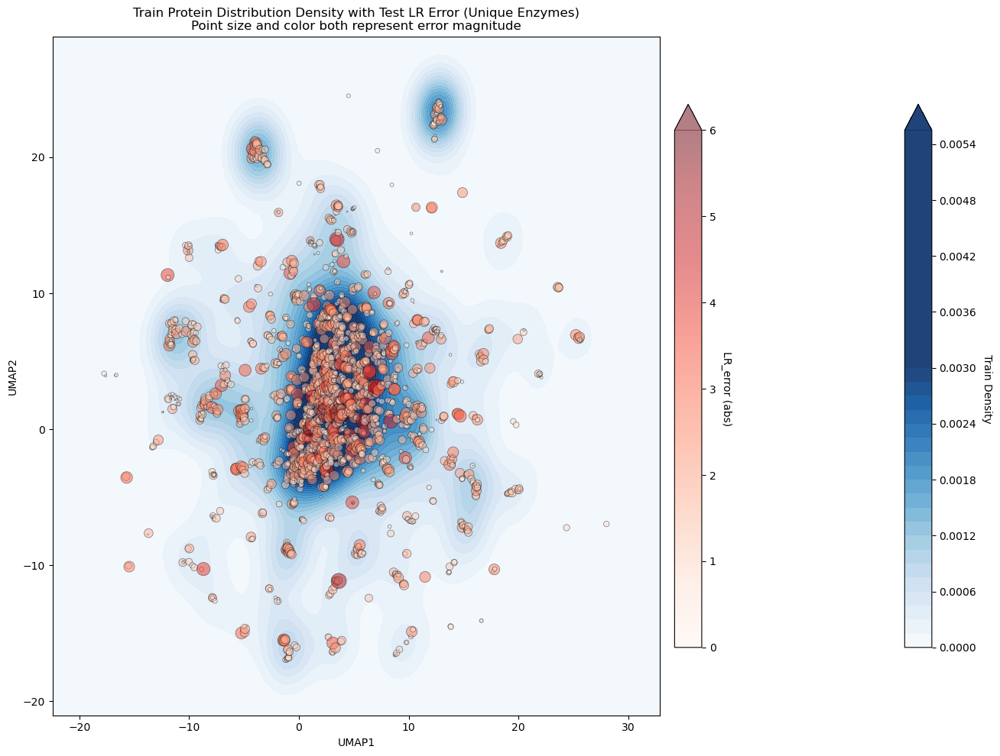

...

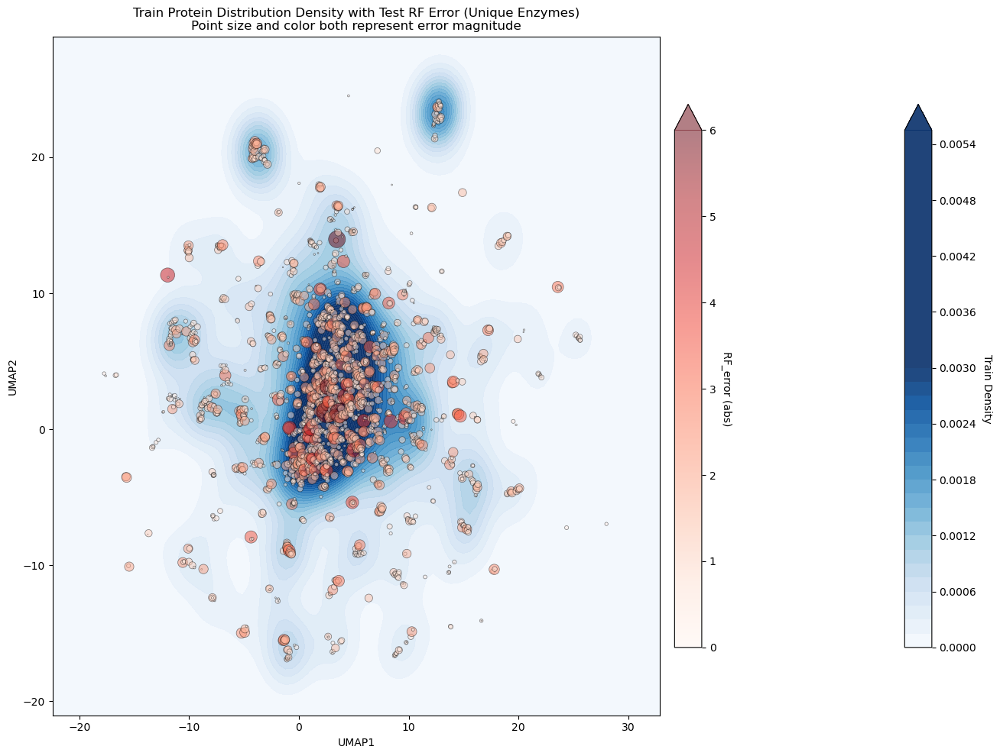

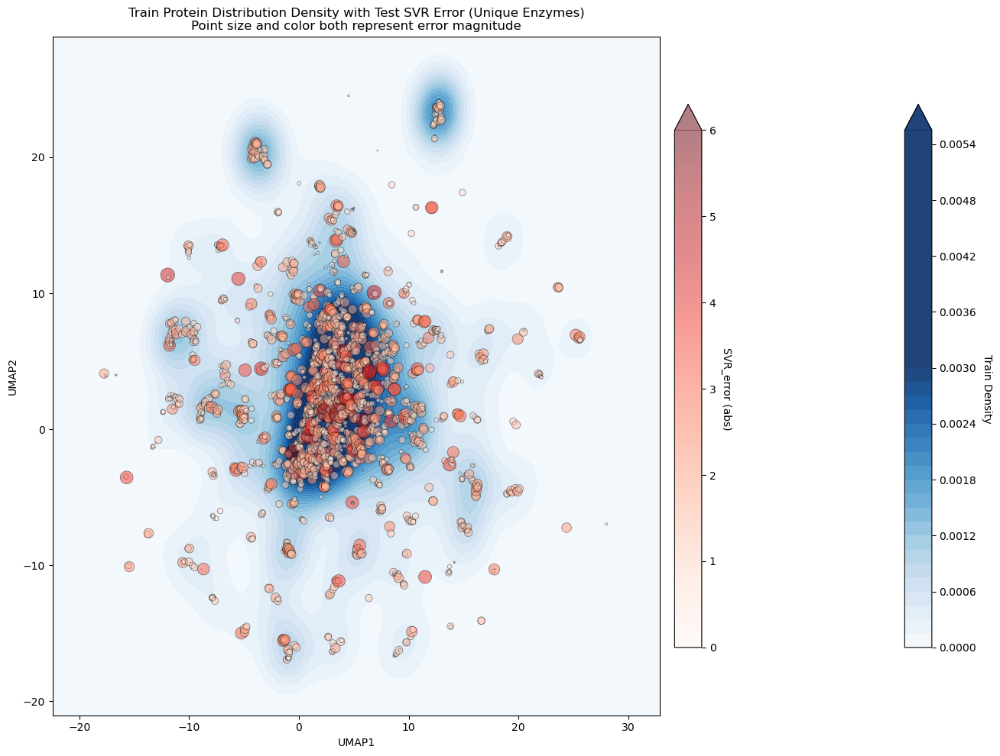

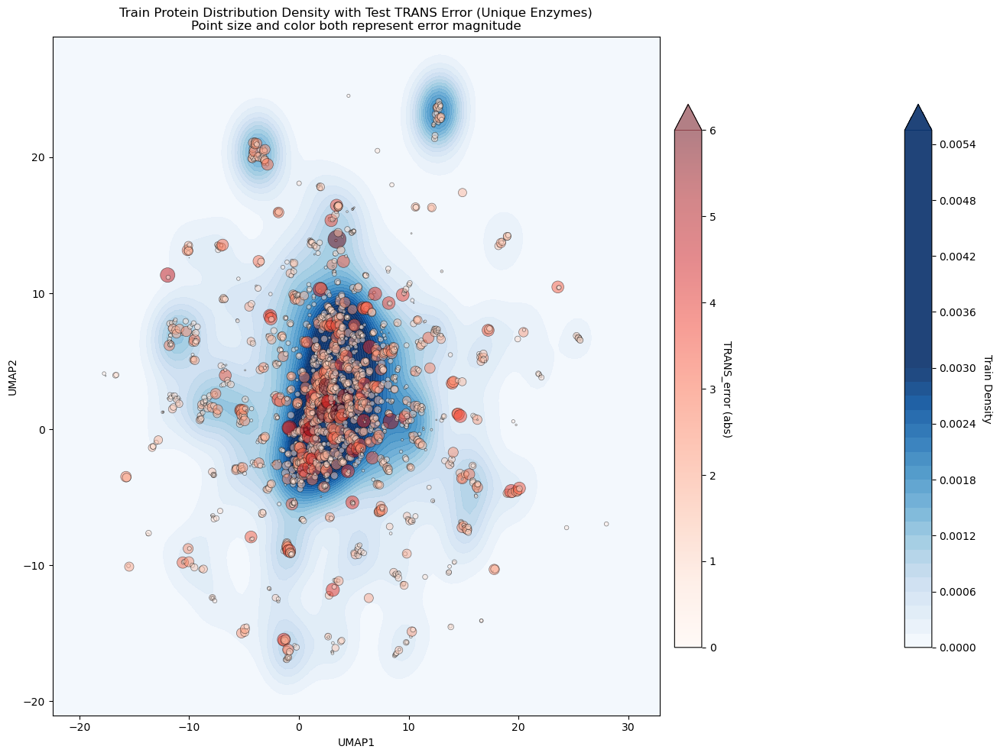

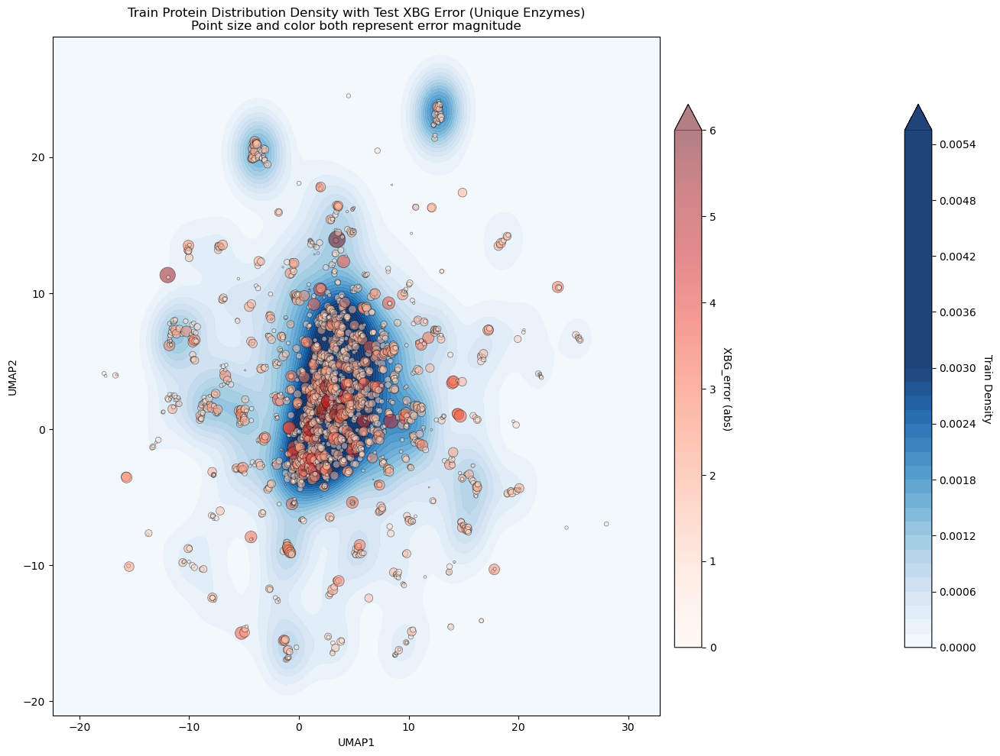

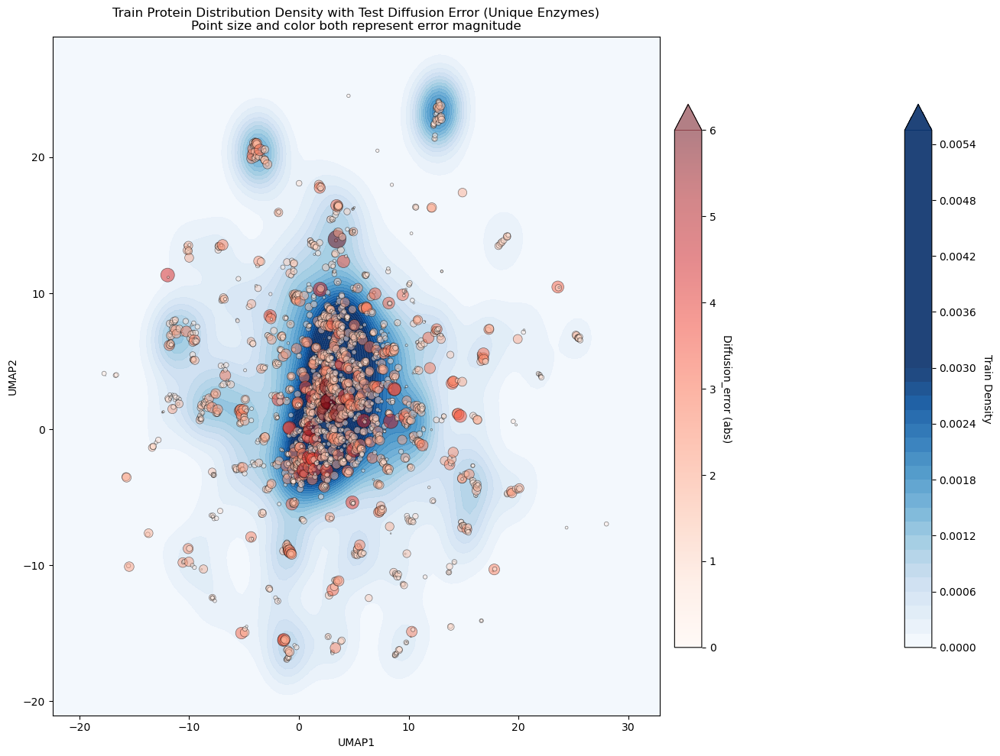

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get UMAP features for training set (protein features)
umap_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "UMAP_feature_protein"]])

# Create grid (with padding)
x_padding = (umap_train[:, 0].max() - umap_train[:, 0].min()) * 0.1
y_padding = (umap_train[:, 1].max() - umap_train[:, 1].min()) * 0.1

x_min, x_max = umap_train[:, 0].min() - x_padding, umap_train[:, 0].max() + x_padding
y_min, y_max = umap_train[:, 1].min() - y_padding, umap_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(umap_train.T)
density = kde(grid_points).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(14, 10))
contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9, vmax=0.003, extend='max') 
cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
cbar1.set_label('Train Density', rotation=270, labelpad=15)
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.set_title(f'Train Protein Distribution Density')
plt.tight_layout()
plt.savefig("./outlier_data/umap_density_protein_plot.png", dpi=600)
plt.savefig("./outlier_data/umap_density_protein_plot.svg")
plt.show()

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])
    
    # Group by protein UMAP coordinates and keep only the maximum error for each unique molecule
    test_filtered['umap_coord'] = test_filtered['UMAP_feature_protein'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('umap_coord')['abs_error'].idxmax()]
    
    # Extract coordinates for plotting (protein features)
    umap1_values_unique = [umap_feat[0] for umap_feat in test_unique["UMAP_feature_protein"]]
    umap2_values_unique = [umap_feat[1] for umap_feat in test_unique["UMAP_feature_protein"]]
    
    # Calculate point sizes based on error (normalize to reasonable range)
    abs_errors = test_unique['abs_error'].values
    min_size = 0
    max_size = 400
    # Normalize errors to size range
    normalized_sizes = min_size + abs_errors/10 * (max_size - min_size)
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap 
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9,vmax=0.003,extend='max')
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot with size and color both representing error
    scatter = ax.scatter(
        umap1_values_unique,
        umap2_values_unique,
        c=abs_errors,  # Color represents error
        s=normalized_sizes,  # Size represents error
        cmap="Reds",
        alpha=0.5,
        edgecolors='black',  # Add black edge for better visibility
        linewidth=0.8,   
        vmin=0,
		vmax=6,  # Set color limits for better visibility     
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02, extend='max')
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_title(f'Train Protein Distribution Density with Test {col} Error (Unique Enzymes)\nPoint size and color both represent error magnitude')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/umap_density_protein_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/umap_density_protein_plot_{col}.svg")
    plt.show()

In [24]:
# t-SNE analysis for metabolite features
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# delete the duplicate rows
X_all = np.vstack(data_with_pred["metabolite_features"].values)
X_test = np.vstack(test_with_pred["metabolite_features"].values)

# find unique rows and their indices
unique_rows, unique_indices = np.unique(X_all, axis=0, return_index=True)
print(f"original data: {X_all.shape[0]} points")
print(f"reduced data: {unique_rows.shape[0]} points")

# use t-SNE for dimensionality reduction
tsne_reducer = TSNE(
    n_components=2, 
    random_state=42,
    perplexity=30,
    max_iter=1000,
    learning_rate=200
)

# fit and transform all data
X_tsne_all = tsne_reducer.fit_transform(X_all)
X_tsne_test = X_tsne_all[index_info['test_index']]

# save t-SNE results to DataFrame
test_with_pred["TSNE_feature_protein"] = [x.tolist() for x in X_tsne_test]
data_with_pred["TSNE_feature_protein"] = [x.tolist() for x in X_tsne_all]


original data: 17010 points
reduced data: 2706 points


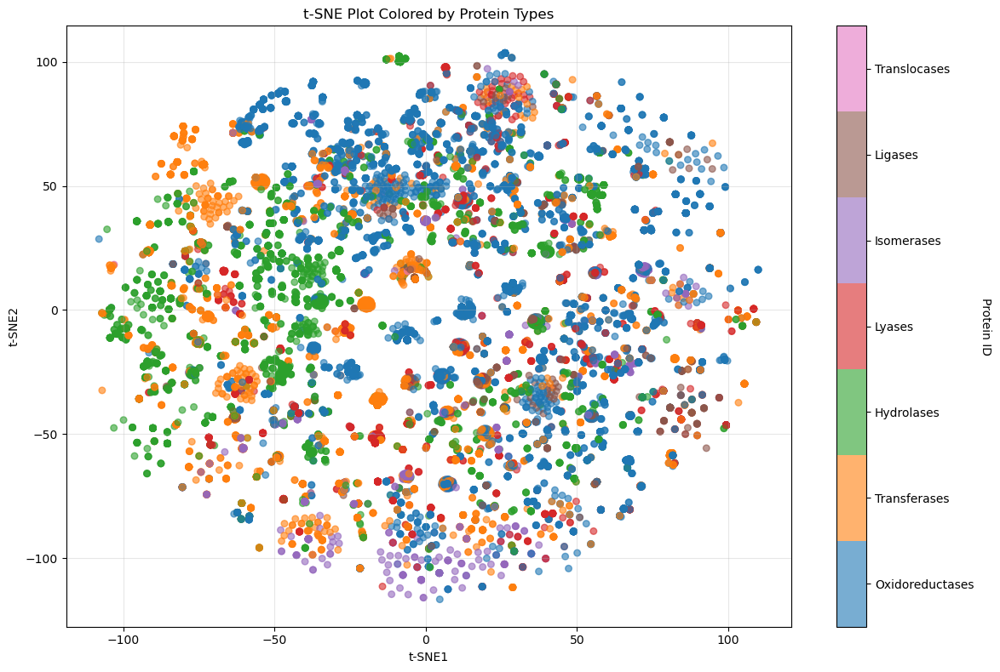

In [25]:
# Plot UMAP with different protein types colored
plt.figure(figsize=(12, 8))

# Get t-SNE coordinates for all data
tsne1_values_all = [tsne_feat[0] for tsne_feat in data_with_pred["TSNE_feature_protein"]]
tsne2_values_all = [tsne_feat[1] for tsne_feat in data_with_pred["TSNE_feature_protein"]]

from matplotlib.colors import ListedColormap
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']
cmap_7 = ListedColormap(colors)


# Use protein_id - 1 to map protein_id 1-7 to colormap indices 0-6
scatter = plt.scatter(
    tsne1_values_all,
    tsne2_values_all,
    c=data_with_pred['protein_id'] - 1,
    alpha=0.6,
    s=30,
    cmap=cmap_7,
    vmin=0,
    vmax=7
)

# Add colorbar
cbar = plt.colorbar(scatter)
cbar.set_label('Protein ID', rotation=270, labelpad=15)

# Set ticks at the center of each color block
cbar.set_ticks([i + 0.5 for i in range(7)])
cbar.set_ticklabels([PROTEIN_TYPES_NAMES[i] for i in range(1, 8)])

plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.title('t-SNE Plot Colored by Protein Types')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("./outlier_data/tsne_protein_types.png", dpi=1200)
plt.savefig("./outlier_data/tsne_protein_types.svg")
plt.show()

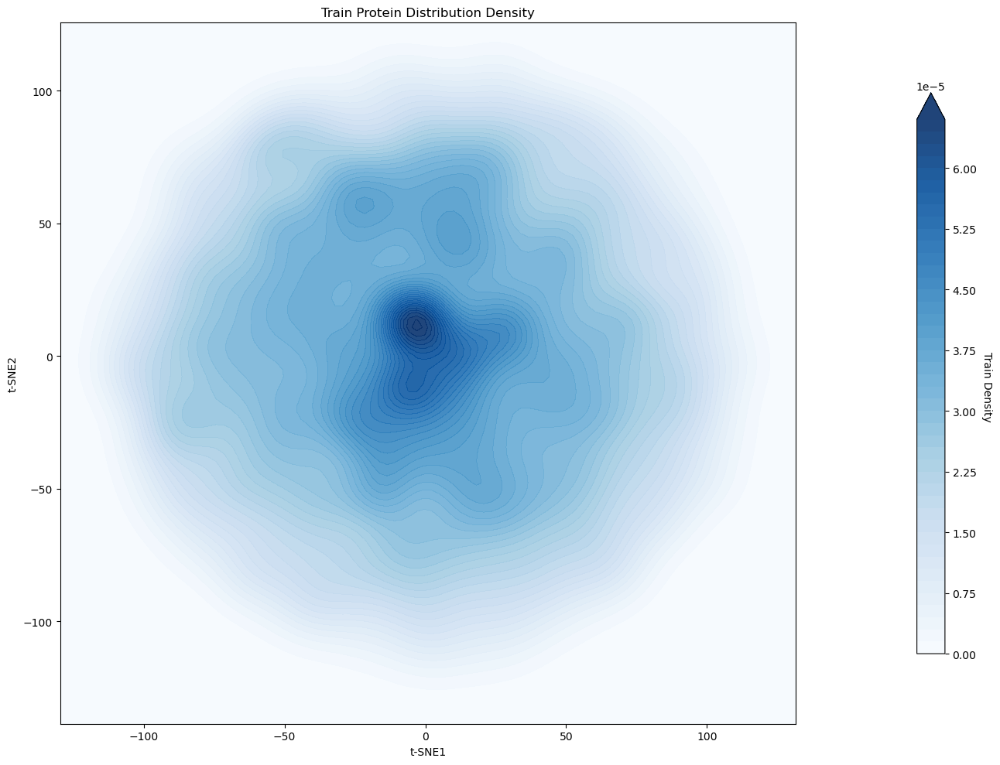

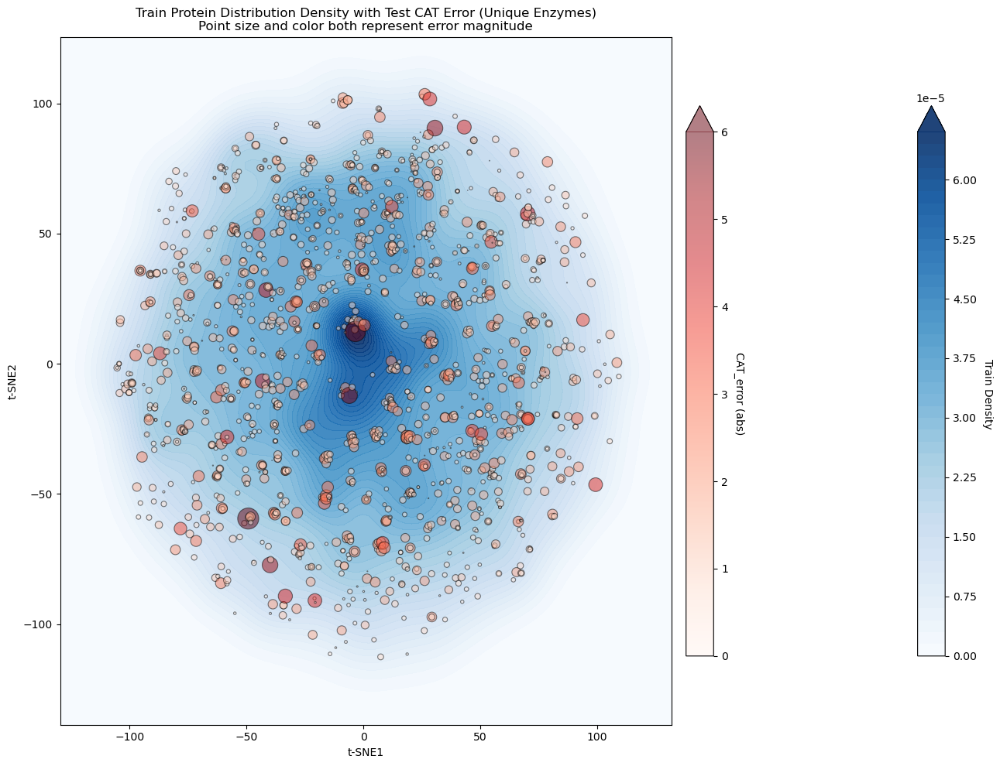

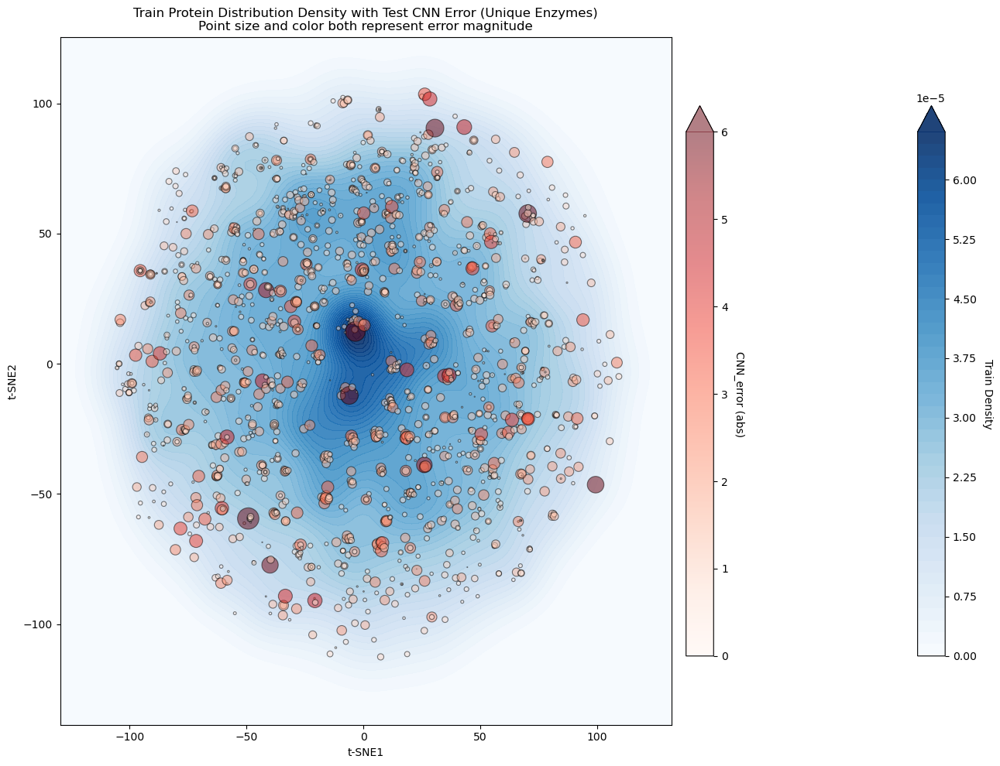

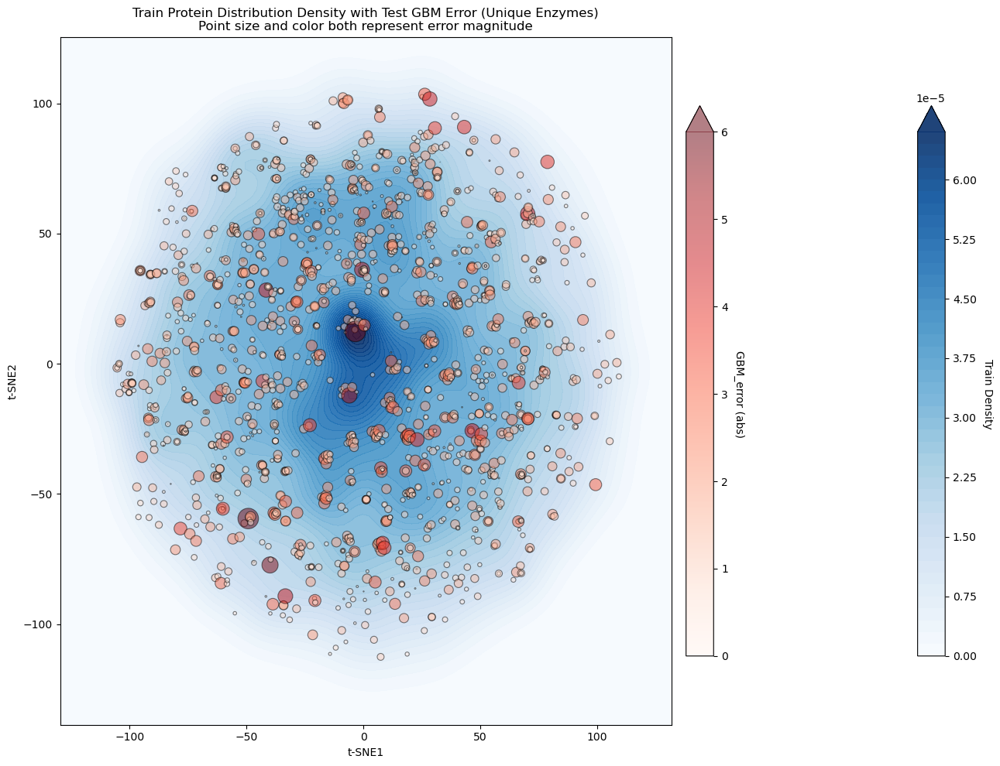

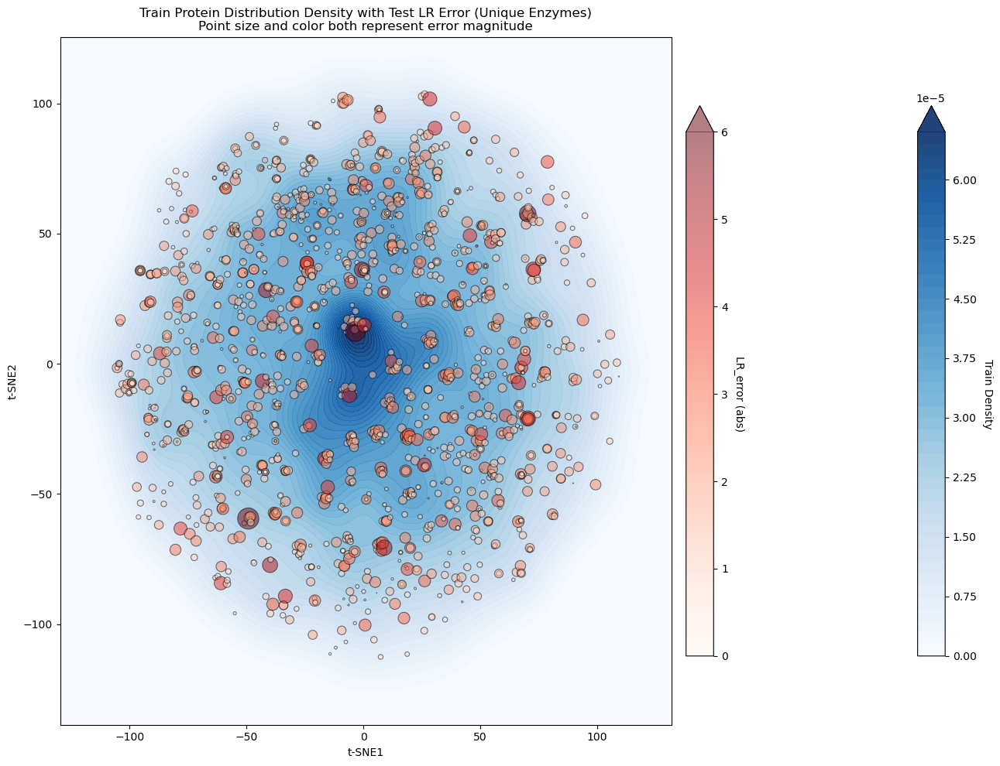

...

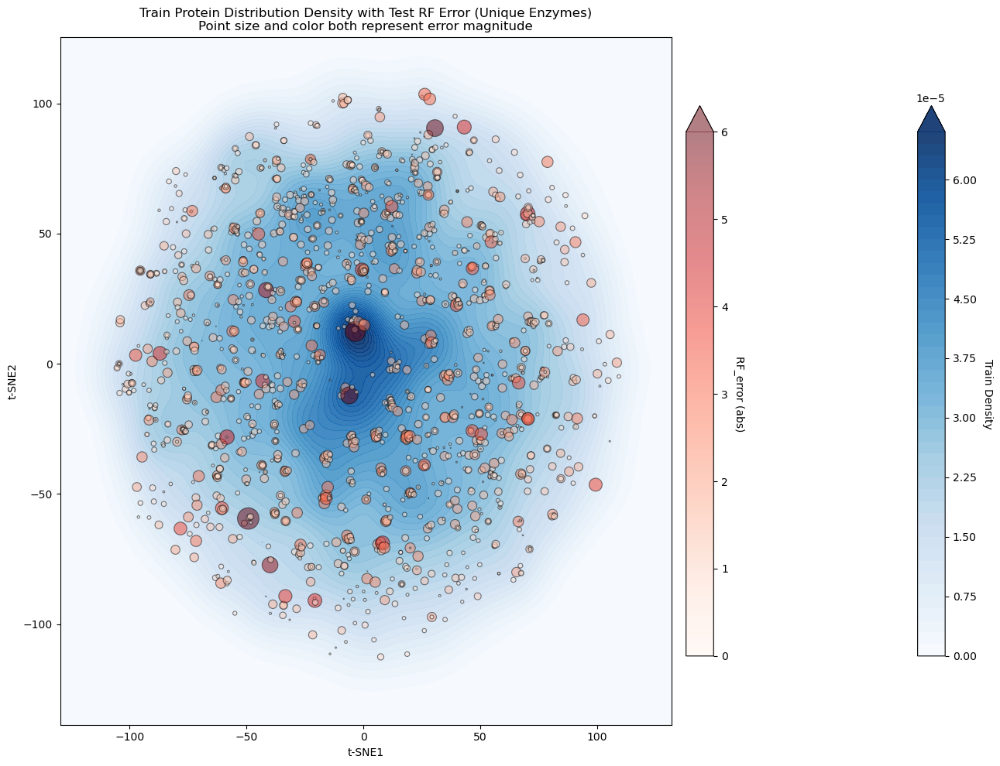

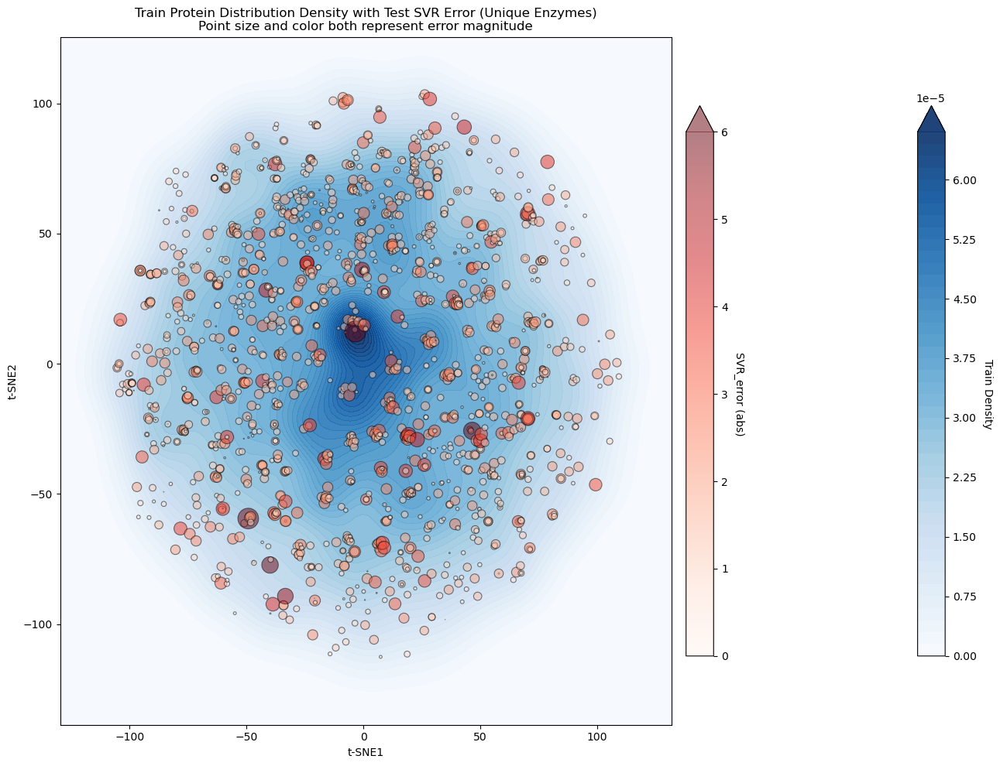

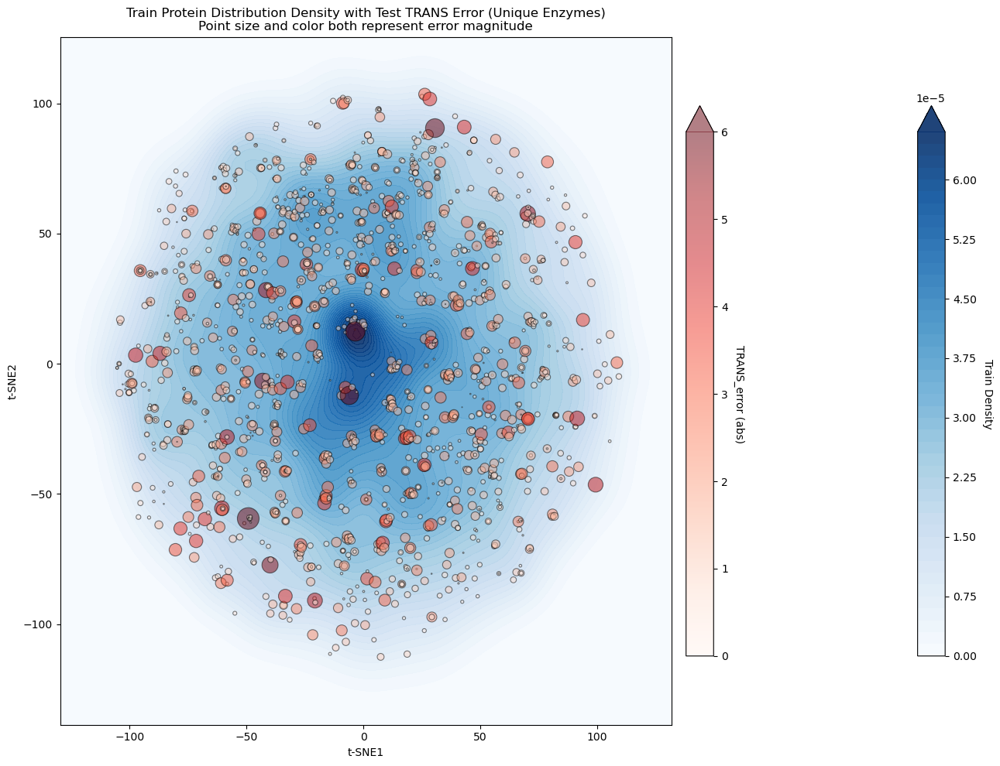

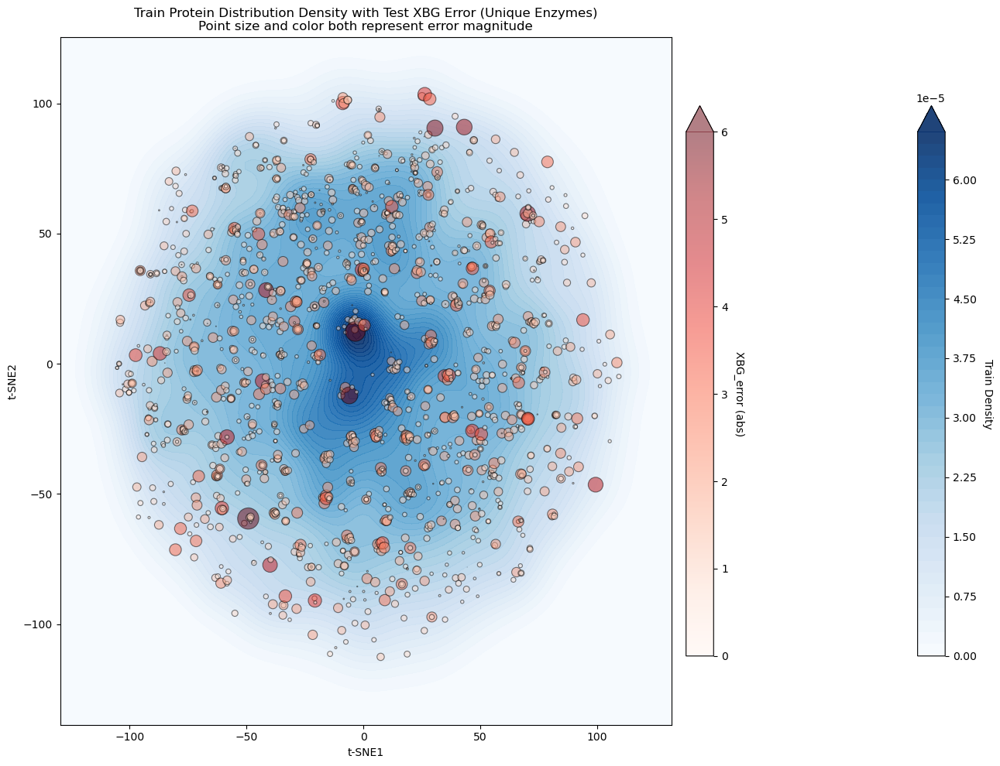

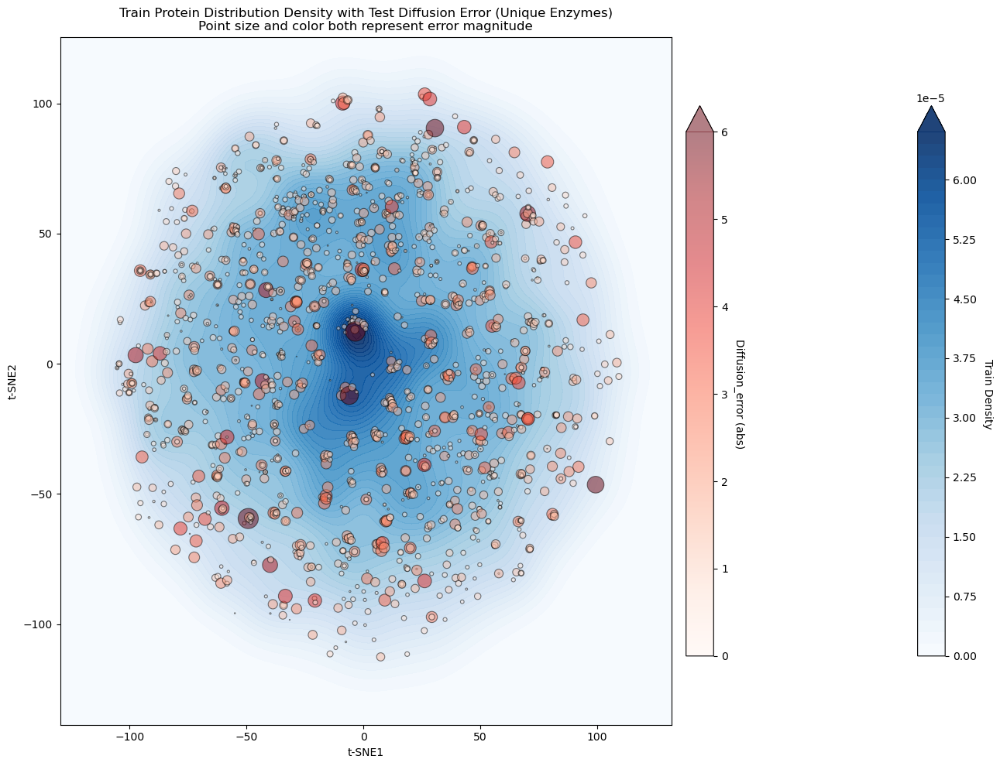

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

# Get t-SNE features for training set (protein features)
tsne_train = np.array([x for x in data_with_pred.loc[index_info['train_index'], "TSNE_feature_protein"]])

# Create grid (with padding)
x_padding = (tsne_train[:, 0].max() - tsne_train[:, 0].min()) * 0.1
y_padding = (tsne_train[:, 1].max() - tsne_train[:, 1].min()) * 0.1

x_min, x_max = tsne_train[:, 0].min() - x_padding, tsne_train[:, 0].max() + x_padding
y_min, y_max = tsne_train[:, 1].min() - y_padding, tsne_train[:, 1].max() + y_padding

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 100),
    np.linspace(y_min, y_max, 100)
)
grid_points = np.vstack([xx.ravel(), yy.ravel()])

# Calculate density using KDE
kde = gaussian_kde(tsne_train.T)
density = kde(grid_points).reshape(xx.shape)

fig, ax = plt.subplots(figsize=(14, 10))
contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9, extend='max') 
cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
cbar1.set_label('Train Density', rotation=270, labelpad=15)
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_title(f'Train Protein Distribution Density')
plt.tight_layout()
plt.savefig("./outlier_data/tsne_density_protein_plot.png", dpi=600)
plt.savefig("./outlier_data/tsne_density_protein_plot.svg")
plt.show()

for col in model_list:
    # Find unique molecules and keep only the one with maximum absolute error
    test_filtered = test_with_pred.copy()
    test_filtered['abs_error'] = np.abs(test_filtered[col+'_error'])

    # Group by protein t-SNE coordinates and keep only the maximum error for each unique molecule
    test_filtered['tsne_coord'] = test_filtered['TSNE_feature_protein'].apply(tuple)
    test_unique = test_filtered.loc[test_filtered.groupby('tsne_coord')['abs_error'].idxmax()]

    # Extract coordinates for plotting (protein features)
    tsne1_values_unique = [tsne_feat[0] for tsne_feat in test_unique["TSNE_feature_protein"]]
    tsne2_values_unique = [tsne_feat[1] for tsne_feat in test_unique["TSNE_feature_protein"]]

    # Calculate point sizes based on error (normalize to reasonable range)
    abs_errors = test_unique['abs_error'].values
    min_size = 0
    max_size = 400
    # Normalize errors to size range
    normalized_sizes = min_size + abs_errors/10 * (max_size - min_size)
    
    # Plot
    fig, ax = plt.subplots(figsize=(14, 10))

    # Layer 1: density heatmap 
    contour = ax.contourf(xx, yy, density, levels=50, cmap='Blues', alpha=0.9,extend='max')
    cbar1 = plt.colorbar(contour, ax=ax, shrink=0.8, aspect=20, pad=0.12)
    cbar1.set_label('Train Density', rotation=270, labelpad=15)

    # Layer 2: test points scatter plot with size and color both representing error
    scatter = ax.scatter(
        tsne1_values_unique,
        tsne2_values_unique,
        c=abs_errors,  # Color represents error
        s=normalized_sizes,  # Size represents error
        cmap="Reds",
        alpha=0.5,
        edgecolors='black',  # Add black edge for better visibility
        linewidth=0.8,   
        vmin=0,
		vmax=6,  # Set color limits for better visibility     
    )
    cbar2 = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=20, pad=0.02, extend='max')
    cbar2.set_label(f'{col}_error (abs)', rotation=270, labelpad=15)

    ax.set_xlabel('t-SNE1')
    ax.set_ylabel('t-SNE2')
    ax.set_title(f'Train Protein Distribution Density with Test {col} Error (Unique Enzymes)\nPoint size and color both represent error magnitude')
    plt.tight_layout()
    plt.savefig(f"./outlier_data/tsne_density_protein_plot_{col}.png", dpi=600)
    plt.savefig(f"./outlier_data/tsne_density_protein_plot_{col}.svg")
    plt.show()